# Analyses  des  virus etudiés

In [2]:
#!pip install --upgrade numpy pandas matplotlib seaborn

In [3]:
#!pip install --upgrade openpyxl

In [4]:
## importations des bibliotheques
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
from datetime import datetime

#print("bibliotheques importés")

In [5]:
## importations des Fichiers
fichier_excel = "C:/Users/NTOYB/Videos/virus_africa_analyse/virus_africa_analyse/data_final_entre_2016_2024.xlsx"

# Charger le fichier Excel
try:
    df = pd.read_excel(fichier_excel)
    print("✅ Fichier importé avec succès")
except FileNotFoundError:
    print("❌ Fichier non trouvé. Vérifie le chemin.")
except Exception as e:
    print(f"❌ Une erreur est survenue : {e}")

✅ Fichier importé avec succès


In [6]:
# Nettoyage de données du fichiers
data_original=df.copy()

### Conversion de la colonne 'Date' en datetime
data_original["Date"] = pd.to_datetime(data_original["Date"], format="%Y/%m/%d")
data_original["year"]=data_original["Date"].dt.year

### Remplacement dans la colonne "Pays"


corrections_pays = {
    "Guine Bissau": "Guinea-Bissau",
    "Ivory Coast": "Côte d'Ivoire",
    'S╞o Tomé and Príncipe': 'Sao Tome and Principe',
    'South Africa1': 'South Africa'
}

data_original["Pays"] = data_original["Pays"].replace(corrections_pays)


## selectins des années 2016 et 2024
data_original = data_original[(data_original["year"] < 2025) & (data_original["year"] > 1940)]

## creations des colonne l'avant et de l'apres pandemie
data_original["pandemie"] = np.where(data_original["year"] < 2020, "Before pandemic", "After pandemic")

## Supprimer les lignes NaN ou vides dans Authors_Countries
data_original = data_original[
    data_original["Authors_Countries"].notna() &
    (data_original["Authors_Countries"].str.strip() != "")
]

In [7]:
#data_original.isna().sum()

In [8]:
## data utilisé sans  doublons de  pmid
data_pmid_unique=data_original.drop_duplicates(subset="PMID")

In [9]:
# importer le fichier contenat  les noms de virus
file_virus= "C:/Users/NTOYB/Videos/virus_africa_analyse/virus_africa_analyse/liste_virus_final.xlsx"
list_of_virus= pd.read_excel(file_virus)
print("✅ Fichier importé avec succès")



✅ Fichier importé avec succès


In [10]:
data_original.columns

Index(['PMID', 'Pays', 'Date', 'Affiliation', 'Authors_Countries',
       'Detected_Viruses', 'Detected_Genus', 'Detected_Families',
       'clé_composite', 'year', 'pandemie'],
      dtype='object')

In [11]:
## creation d'une  liste de virus
virus_name= [virus.strip().lower() for virus in list_of_virus['Virus']]
virus_name[1:6]

['torque teno virus',
 'junin arenavirus',
 'lassa virus',
 'lymphocytic choriomeningitis virus',
 'machupo virus']

In [12]:
## Créer  avec toutes les nouvelles colonnes de virus
new_columns = pd.DataFrame(0, index=data_pmid_unique.index, columns=virus_name)
## Concaténer avec le DataFrame original
data_n = pd.concat([data_pmid_unique, new_columns], axis=1)

In [13]:
## netoyage de la colonne "Detected_Viruses"
for index, row in data_n.iterrows():
    val = row["Detected_Viruses"]

    if isinstance(val, list):
        data_n.at[index, "Detected_Viruses"] = ", ".join(val)
    else:
        cleaned = str(val).strip("[]").replace("'", "").strip()
        data_n.at[index, "Detected_Viruses"] = ", ".join([v.strip() for v in cleaned.split(",") if v.strip()])


In [14]:
data_n["Detected_Viruses"]

0                            Human papillomavirus
1                               Hepatitis C virus
2                            Human papillomavirus
3                              Epstein-Barr virus
4        Rift valley fever virus, West Nile virus
                           ...                   
37375                Human immunodeficiency virus
37378                Human immunodeficiency virus
37384                    Human SARS coronavirus 2
37389                Human immunodeficiency virus
37390                    Human SARS coronavirus 2
Name: Detected_Viruses, Length: 29933, dtype: object

In [15]:
## completions du tableau
for index, row in data_n.iterrows():
    cell = row["Detected_Viruses"]

    if pd.isna(cell):  # Si la cellule est vide (NaN), on la saute
        continue

    detected = cell.split(",")
    #print(detected)
    for virus in detected:
        virus = virus.strip().lower()
        # Vérifie si le nom du 'virus' est une colonne
        if virus in data_n.columns:
            # Initialise à 0 si la valeur est NaN avant d'incrémenter
            if pd.isna(data_n.at[index, virus]):
                data_n.at[index, virus] = 0
            data_n.at[index, virus] += 1


In [16]:
data_n.head(3)

,PMID,Pays,Date,Affiliation,Authors_Countries,Detected_Viruses,Detected_Genus,Detected_Families,clé_composite,year,...,sindbis virus,venezuelan equine encephalitis virus,western equine encephalitis virus,rubella virus,hepatitis delta virus,hepatitis e virus,murray valley encephalitis virus,human papillomavirus,oropouche virus,human rhinovirus
0,26854905,Algeria,2016-02-09,"micalis institute, inra, agroparistech, univer...",Algérie; Brésil; France,Human papillomavirus,['Papillomavirus'],['Papillomaviridae'],26854905_Algeria,2016,...,0,0,0,0,0,0,0,1,0,0
1,26856380,Algeria,2016-02-10,"laboratoire des hépatites virales, institut pa...",Algérie; France,Hepatitis C virus,['Hepacivirus'],['Flaviviridae'],26856380_Algeria,2016,...,0,0,0,0,0,0,0,0,0,0
2,27085765,Algeria,2016-04-18,"université de tlemcen, laboratoire de microbio...",Algérie; France; Maroc,Human papillomavirus,['Papillomavirus'],['Papillomaviridae'],27085765_Algeria,2016,...,0,0,0,0,0,0,0,1,0,0


# Analyse exploratoire des virus étudiés avant et après la pandémie de COVID-19

In [17]:
## creation des copie de  dataset
#data_n
data_virus=data_n.copy() 
### copie  utilisé  pour  la  partie coetude
data_viru_coetude=data_n.copy()

In [18]:
data_virus.isna().sum()

PMID                                0
Pays                                0
Date                                0
Affiliation                         0
Authors_Countries                   0
                                   ..
hepatitis e virus                   0
murray valley encephalitis virus    0
human papillomavirus                0
oropouche virus                     0
human rhinovirus                    0
Length: 133, dtype: int64

In [19]:
### selections des colonnes d'interets
data_virus = data_virus.drop(columns=['Pays', 'Date', 'Affiliation', 'Authors_Countries', 'Detected_Viruses', 'Detected_Genus',
                           'Detected_Families', 'clé_composite'])
data_virus["PMID"] = data_virus ["PMID"].astype(str)
data_virus["year"] = data_virus ["year"].astype(str)

In [20]:
data_virus.head(1)

,PMID,year,pandemie,human adenovirus,torque teno virus,junin arenavirus,lassa virus,lymphocytic choriomeningitis virus,machupo virus,human astrovirus,...,sindbis virus,venezuelan equine encephalitis virus,western equine encephalitis virus,rubella virus,hepatitis delta virus,hepatitis e virus,murray valley encephalitis virus,human papillomavirus,oropouche virus,human rhinovirus
0,26854905,2016,Before pandemic,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [21]:
totaux_chaque_virus = data_virus.select_dtypes(include=['number']).sum()

In [22]:
# Création d'un DataFrame avec une seule ligne indexée "totaux"
df_total_virus = pd.DataFrame(totaux_chaque_virus)

df_total_virus = totaux_chaque_virus.reset_index()
df_total_virus.columns = ["virus_name", "totaux"]

In [23]:
df_total_virus.sample(3)

,virus_name,totaux
78,bk polyomavirus,11
16,norovirus,288
115,rubella virus,51


In [24]:
data_final =df_total_virus.copy()
data_final_virus = data_final.copy()

In [25]:
# Données filtrées
data_final_virus= data_final[data_final['totaux'] > 0]


In [26]:
## 3. Ajouter  les groupes de  familly dans le figure sur  figure
list_of_virus.columns = [col.strip() for col in list_of_virus.columns]

list_virus_family=list_of_virus[["Virus",'Family']]
list_virus_family.head(2)

### convertir les virus: familly en dictionnaire
virus_to_family = list_virus_family.set_index('Virus')['Family'].str.strip().to_dict()

### mapper  les dictionnaire dans le dataframe

data_with_family=data_final_virus[['virus_name','totaux']]


data_with_family['virus_name'] = data_with_family['virus_name'].str.strip().str.upper()

# Nettoyage dans le dictionnaire
virus_to_family = {k.strip().upper(): v for k, v in virus_to_family.items()}

# Appliquer map avec les versions nettoyées
data_with_family['Family'] = data_with_family['virus_name'].map(virus_to_family)



In [27]:
data_virus_family_copy=data_with_family.copy()

In [28]:
data_with_family.head(3)

,virus_name,totaux,Family
0,HUMAN ADENOVIRUS,567,Adenoviridae
1,TORQUE TENO VIRUS,20,Anelloviridae
2,JUNIN ARENAVIRUS,52,Arenaviridae


### AJOUTER LE PANDEMIE DANS LE DATAFRAME

In [29]:
data_virus.columns

Index(['PMID', 'year', 'pandemie', 'human adenovirus', 'torque teno virus',
       'junin arenavirus', 'lassa virus', 'lymphocytic choriomeningitis virus',
       'machupo virus', 'human astrovirus',
       ...
       'sindbis virus', 'venezuelan equine encephalitis virus',
       'western equine encephalitis virus', 'rubella virus',
       'hepatitis delta virus', 'hepatitis e virus',
       'murray valley encephalitis virus', 'human papillomavirus',
       'oropouche virus', 'human rhinovirus'],
      dtype='object', length=125)

In [30]:
# Sélectionner uniquement les colonnes numériques avant le groupby
colonne_int = data_virus.select_dtypes(include=['number']).columns

# Faire le groupby et sommer uniquement sur ces colonnes numériques
data_virus_pandemie= data_virus.groupby('pandemie')[colonne_int].sum()

#data_virus_pandemie.sample(2)

In [31]:
# Remettre 'pandemie' en colonne
data_virus_pandemie = data_virus_pandemie.reset_index()

# Transformer en format long
data_virus_pandemie_trans = data_virus_pandemie.melt(id_vars='pandemie', var_name='name_virus', value_name='totaux')
data_virus_pandemie_trans = data_virus_pandemie_trans[data_virus_pandemie_trans["name_virus"] != 'index']

In [32]:
data_virus_family_pandemie_trans=data_virus_pandemie_trans.copy()


In [33]:
#### Nettoyer les noms de colonnes dans list_of_virus (ton DataFrame contenant Virus et Family)
list_of_virus.columns = [col.strip() for col in list_of_virus.columns]

### Extraire les colonnes Virus et Family
list_virus_family = list_of_virus[['Virus', 'Family']]

#### Créer le dictionnaire de mappage virus -> family
virus_to_family = list_virus_family.set_index('Virus')['Family'].str.strip().to_dict()

#### Haromonisation les clés et valeurs du dictionnaire (mettre en majuscule pour correspondance uniforme)
virus_to_family = {k.strip().upper(): v.strip() for k, v in virus_to_family.items()}

#### Haromonisation des nom_virus
data_virus_family_pandemie_trans['name_virus_clean'] = data_virus_family_pandemie_trans['name_virus'].str.strip().str.upper()

## le mapping de la famille dans une nouvelle colonne 'Family'
data_virus_family_pandemie_trans['Family'] = data_virus_family_pandemie_trans['name_virus_clean'].map(virus_to_family)

## supprimer la colonne intermédiaire
data_virus_family_pandemie_trans = data_virus_family_pandemie_trans.drop(columns=['name_virus_clean'])

## Cloud Word figure

In [34]:
data_with_family=data_virus_family_pandemie_trans.copy()

In [35]:
data_with_family.columns

Index(['pandemie', 'name_virus', 'totaux', 'Family'], dtype='object')

In [36]:
# Création d'une DataFrame avec nom des virus et total
data_virus_fig = (
    data_with_family
    .groupby('name_virus', as_index=False)['totaux']
    .sum()
)

In [37]:
#pip -q install wordcloud

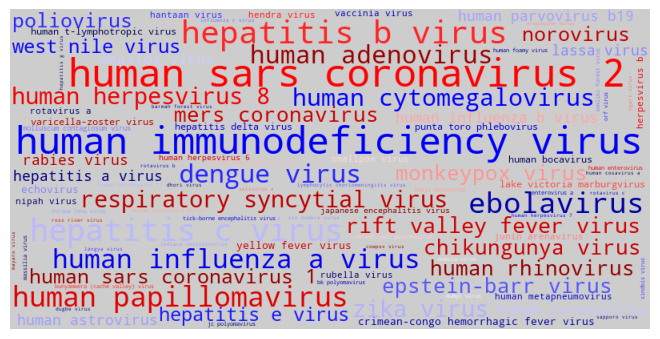

In [38]:
from wordcloud import WordCloud
# Dictionnaire {mot: poids}

data_virus_fig['name_virus'] = data_virus_fig['name_virus'].astype(str).str.replace(r'\s+', ' ', regex=True).str.strip()
word_weights = dict(zip(data_virus_fig['name_virus'], data_virus_fig['totaux']))

# Nuage de mots ultra-compact
wordcloud = WordCloud(
    width=800,
    height=400,
    background_color='#cecdcd',
    colormap='seismic',       # ou 'plasma', 'magma' pour plus de contraste
    #colormap='bwr',
    #prefer_horizontal=0.5,    # favorise l'horizontalité (0.9 = 90%)
    scale=1,                  # qualité de rendu (augmente la compaction)
    collocations=True,       # évite les répétitions adjacentes
    min_font_size=6,          # taille minimale des mots
    #max_words=200,            # limite le nombre de mots
    relative_scaling=0.2      # 0 = taille purement basée sur le poids, 1 = plus écart
).generate_from_frequencies(word_weights)

# Affichage sans bordures
plt.figure()  # Taille et résolution ajustées
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

### circular graph

In [39]:
data_with_family.columns
data_with_family_cir=data_with_family[['Family','name_virus', 'totaux']]

In [40]:
# Regrouper par 'Family' et 'name_virus'  ++ 'totaux'
data_with_family_cir=data_with_family_cir.groupby(['Family', 'name_virus'], as_index=False)['totaux'].sum()


In [41]:
data_with_family_cir=data_with_family_cir[['name_virus', 'totaux']]
data_with_family_cir=data_with_family_cir[data_with_family_cir['totaux']>=20]

In [42]:
# Création d'une DataFrame avec nom des virus et total
df = data_with_family_cir.rename(columns={
    'name_virus':'Name',
    'totaux':'Value'

}).copy()

df = df.sort_values(by="Value", ascending=True)

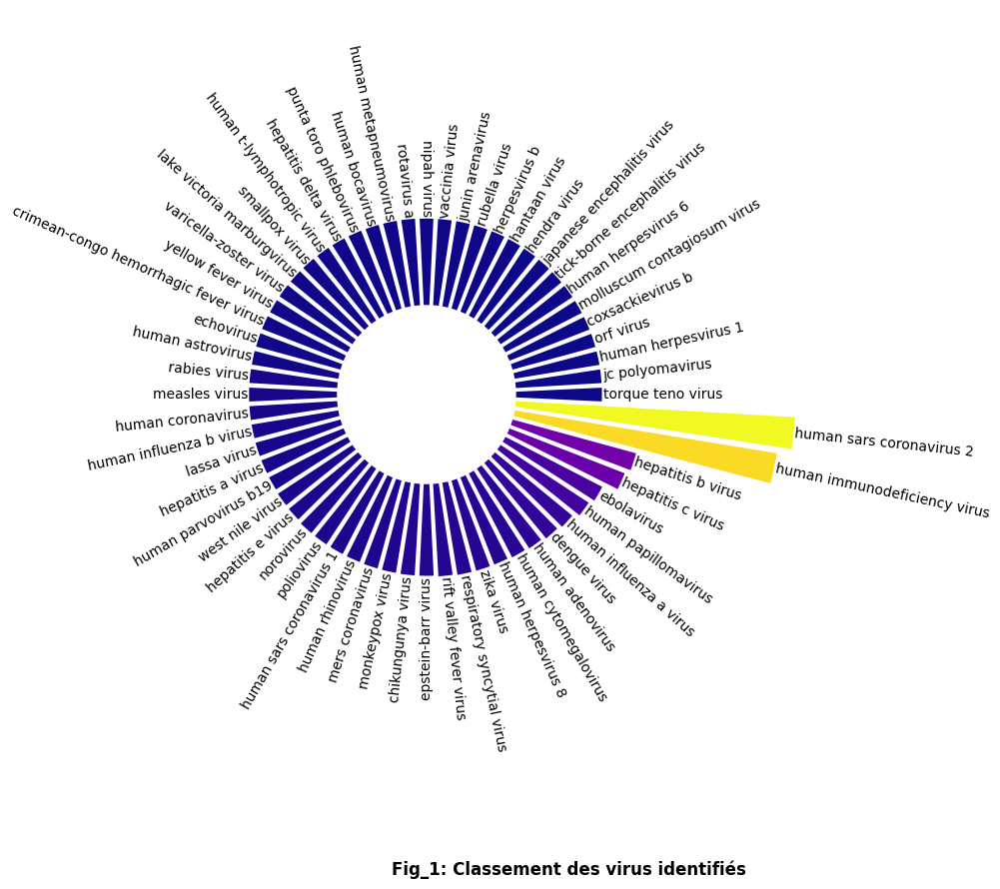

In [43]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que df est votre DataFrame et qu'il a des colonnes 'Name' et 'Value'
sizes = pd.to_numeric(df["Value"], errors='coerce').values
labels = df['Name'].values

# Paramètres pour le graphique polaire
plt.figure(figsize=(30, 10))
ax = plt.subplot(111, polar=True)
plt.axis('off')

# Limites et calculs pour les hauteurs des barres
upperLimit = 160
lowerLimit = 50
max_val = sizes.max()

# Conversion des tailles en hauteurs adaptées à la plage (lowerLimit -> upperLimit)
slope = (upperLimit - lowerLimit) / max_val
heights = slope * sizes + lowerLimit

# Largeur et angle des barres
num_bars = len(sizes)
width = 2 * np.pi / num_bars
angles = np.linspace(0, 2 * np.pi, num_bars, endpoint=False)

# Dessin des barres
bars = ax.bar(
    x=angles,
    height=heights,
    width=width * 0.9,  # Légèrement plus étroit pour espacer les barres
    bottom=lowerLimit,
    linewidth=2,
    edgecolor="white",
    color=plt.cm.plasma(sizes / max_val)  # Couleur basée sur la taille
)

# Ajout des labels aux extrémités des barres
for angle, height, label in zip(angles, heights, labels):
    rotation = np.degrees(angle)
    alignment = "left"
    # Ajustement de l'angle du texte pour le rendre lisible
    if angle >= np.pi / 2 and angle <= 3 * np.pi / 2:
        rotation += 180
        alignment = "right"
    ax.text(
        x=angle,
        y=height + 50,  # Un peu au-dessus de la barre
        s=label,
        ha=alignment,
        va='center',
        rotation=rotation,
        rotation_mode="anchor",
        fontsize=10

    )

plt.gcf().text(
    x=0.56,   # centré horizontalement
    y=0.01,  # légèrement au-dessus du bord inférieur de la figure
    s="Fig_1: Classement des virus identifiés",
    fontsize=12,
    fontweight='bold',
    color='black',
    ha='center',  # alignement horizontal
    va='bottom'   # alignement vertical : le bas du texte correspond à y=0.01
)

plt.show()


#### famille

In [44]:

data_with_family_cir_fam = data_with_family[['Family', 'totaux']]

data_with_family_cir_fam = data_with_family_cir_fam.groupby('Family', as_index=False)["totaux"].sum()

df = data_with_family_cir_fam.rename(columns={
    'Family': 'Name',
    'totaux': 'Value'
}).copy()

df = df.sort_values(by="Value", ascending=True)


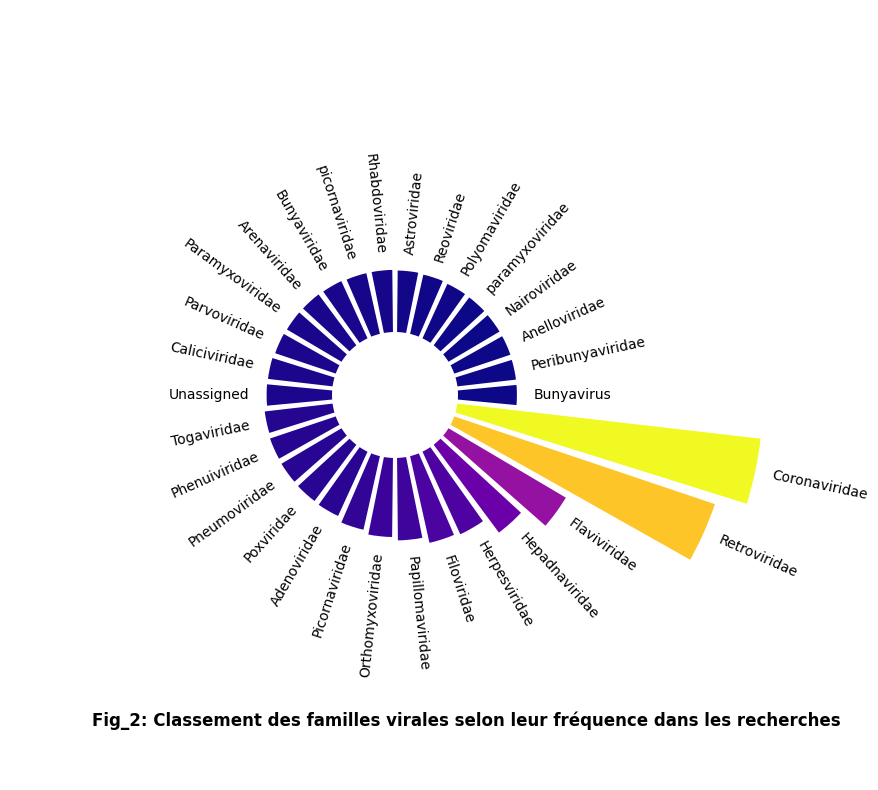

In [45]:
import matplotlib.pyplot as plt
import numpy as np

# Supposons que df est votre DataFrame et qu'il a des colonnes 'Name' et 'Value'
sizes = pd.to_numeric(df["Value"], errors='coerce').values
labels = df['Name'].values

# Paramètres pour le graphique polaire
plt.figure(figsize=(15, 10))
ax = plt.subplot(111, polar=True)
plt.axis('off')

# Limites et calculs pour les hauteurs des barres
upperLimit = 100
lowerLimit = 20
max_val = sizes.max()

# Conversion des tailles en hauteurs adaptées à la plage (lowerLimit -> upperLimit)
slope = (upperLimit - lowerLimit) / max_val
heights = slope * sizes + lowerLimit

# Largeur et angle des barres
num_bars = len(sizes)
width = 2 * np.pi / num_bars
angles = np.linspace(0, 2 * np.pi, num_bars, endpoint=False)

# Dessin des barres
bars = ax.bar(
    x=angles,
    height=heights,
    width=width * 0.9,  # Légèrement plus étroit pour espacer les barres
    bottom=lowerLimit,
    linewidth=2,
    edgecolor="white",
    color=plt.cm.plasma(sizes / max_val)  # Couleur basée sur la taille
)

# Ajout des labels aux extrémités des barres
for angle, height, label in zip(angles, heights, labels):
    rotation = np.degrees(angle)
    alignment = "left"
    # Ajustement de l'angle du texte pour le rendre lisible
    if angle >= np.pi / 2 and angle <= 3 * np.pi / 2:
        rotation += 180
        alignment = "right"
    ax.text(
        x=angle,
        y=height + 25,  # Un peu au-dessus de la barre
        s=label,
        ha=alignment,
        va='center',
        rotation=rotation,
        rotation_mode="anchor",
        fontsize=10
    )

plt.gcf().text(
    x=0.56,   # centré horizontalement
    y=0.16,  # légèrement au-dessus du bord inférieur de la figure
    s="Fig_2: Classement des familles virales selon leur fréquence dans les recherches",
    fontsize=12,
    fontweight='bold',
    color='black',
    ha='center',  # alignement horizontal
    va='bottom'   # alignement vertical : le bas du texte correspond à y=0.01
)

plt.show()


In [46]:
data_with_family.columns

Index(['pandemie', 'name_virus', 'totaux', 'Family'], dtype='object')

In [47]:
#!pip -q install plotly holoviews bokeh

In [48]:
import pandas as pd
import plotly.express as px
import plotly.io as pio

pio.renderers.default = "notebook"  # ou "notebook_connected"

# 1. Concaténer les noms de virus par Family et pandémie
data_hover = data_with_family.groupby(['Family', 'pandemie']).agg(
    totaux=('totaux', 'sum'),
    viruses=('name_virus', lambda x: ', '.join(x))
).reset_index()

# 2. Créer l'histogramme
fig = px.bar(
    data_hover,
    x='Family',
    y='totaux',
    color='pandemie',
    barmode='group',
    hover_data=['viruses', 'totaux']  # Affiche tous les virus au survol
)

fig.show()


In [49]:
data_with_family.columns

Index(['pandemie', 'name_virus', 'totaux', 'Family'], dtype='object')

In [50]:
data_with_family.head(2)


,pandemie,name_virus,totaux,Family
0,After pandemic,human adenovirus,335,Adenoviridae
1,Before pandemic,human adenovirus,232,Adenoviridae


In [51]:
data_final.head(2)

,virus_name,totaux
0,human adenovirus,567
1,torque teno virus,20


### Top 10  virus  les plus etudiées avant et apres covid



In [52]:

# 1. Filtrer les données
df_avant_covid = (data_with_family[data_with_family['pandemie'] == 'Before pandemic']
            .groupby('name_virus', as_index=False)['totaux']
            .sum()
            )
df_avant_covid =df_avant_covid.sort_values("totaux", ascending=False)
df_avant_covid_10=df_avant_covid.head(8)

df_apres_covid = (data_with_family[data_with_family['pandemie'] == 'After pandemic']
            .groupby('name_virus', as_index=False)['totaux']
            .sum()
            )
df_apres_covid  =df_apres_covid.sort_values("totaux", ascending=False)
df_apres_covid_10= df_apres_covid.head(8)



In [53]:
df_apres_covid_10.head(3)

,name_virus,totaux
57,human sars coronavirus 2,10811
47,human immunodeficiency virus,5575
28,hepatitis b virus,1371


In [54]:
import plotly.express as px
from plotly.subplots import make_subplots

# Couleurs personnalisées
color_avant = ['#1f77b4']  # bleu
color_apres = ['#ff7f0e']  # orange

# Création des figures séparées avec couleur
fig_avant = px.bar(
    df_avant_covid_10,
    x='name_virus', y='totaux',
    color_discrete_sequence=color_avant
)

fig_apres = px.bar(
    df_apres_covid_10,
    x='name_virus', y='totaux',
    color_discrete_sequence=color_apres
)

# Création d'une figure avec 2 colonnes
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Top 8 avant COVID", "Top 8 après COVID")
)

# Ajouter les barres pour "avant COVID"
for trace in fig_avant.data:
    fig.add_trace(trace, row=1, col=1)

# Ajouter les barres pour "après COVID"
for trace in fig_apres.data:
    fig.add_trace(trace, row=1, col=2)

# Mise en forme
fig.update_layout(
    height=500,
    width=1000,
    showlegend=False,
    xaxis_tickangle=-45,   # Rotation labels graphique 1
    xaxis2_tickangle=-45   # Rotation labels graphique 2
)

fig.show()


### Il y a une difference de virus  recherche  avant et apres  le covid

In [55]:
import plotly.graph_objects as go

fig = go.Figure()

# Barres avant COVID
fig.add_trace(go.Bar(
    x=df_avant_covid_10['name_virus'],
    y=df_avant_covid_10['totaux'],
    name='Avant COVID',
    marker_color='blue',
    opacity=0.6
))

# Barres après COVID
fig.add_trace(go.Bar(
    x=df_apres_covid_10['name_virus'],
    y=df_apres_covid_10['totaux'],
    name='Après COVID',
    marker_color='orange',
    opacity=0.6
))

# Superposition
fig.update_layout(
    barmode='overlay',
    xaxis_tickangle=-45,
    title="Comparaison Top 10 Virus avant et après COVID (superposés)"
)

fig.show()


In [56]:
data_virus_pandemie_trans.head()

,pandemie,name_virus,totaux
0,After pandemic,human adenovirus,335
1,Before pandemic,human adenovirus,232
2,After pandemic,torque teno virus,11
3,Before pandemic,torque teno virus,9
4,After pandemic,junin arenavirus,23


In [57]:
data_virus_diff_pand=data_virus_pandemie_trans.pivot(index='name_virus', columns='pandemie', values='totaux').reset_index()


In [58]:
data_virus_diff_pand['total'] = data_virus_diff_pand[["Before pandemic", "After pandemic"]].sum(axis=1)
data_virus_diff_pand['difference'] = (
    data_virus_diff_pand["After pandemic"] -
    data_virus_diff_pand["Before pandemic"]
)


In [59]:
data_virus_diff_pand=data_virus_diff_pand.sort_values("total", ascending=False)

In [60]:
data_virus_diff_pand.head(12)

pandemie,name_virus,After pandemic,Before pandemic,total,difference
57,human sars coronavirus 2,10811,213,11024,10598
47,human immunodeficiency virus,5575,4658,10233,917
28,hepatitis b virus,1371,1050,2421,321
29,hepatitis c virus,1113,1060,2173,53
18,ebolavirus,685,649,1334,36
51,human papillomavirus,716,412,1128,304
48,human influenza a virus,475,343,818,132
14,dengue virus,456,233,689,223
34,human adenovirus,335,232,567,103
39,human cytomegalovirus,291,218,509,73


In [1]:
## PRESENTER LES  VIRUS  ET LES FAMILLE  LES PLUS ETUDIER

#data_virus_family.sample(5)



"""df_filtered_virus= data_virus_family[data_virus_family["totaux"] > 10000]

# 2️⃣ Filtrer les familles avec totaux > 200
df_family_filtered = data_virus_family[data_virus_family["totaux"] > 1500]
df_family_filtered=df_family_filtered.sort_values("totaux", ascending=False)
df_family_filtered=df_family_filtered.head(6)

# 3️⃣ Concaténer les DataFrames (on garde toutes les lignes des deux filtres)
df_final_group = pd.concat([df_family_filtered, df_filtered_virus]).drop_duplicates().reset_index(drop=True)"""

'df_filtered_virus= data_virus_family[data_virus_family["totaux"] > 10000]\n\n# 2️⃣ Filtrer les familles avec totaux > 200\ndf_family_filtered = data_virus_family[data_virus_family["totaux"] > 1500]\ndf_family_filtered=df_family_filtered.sort_values("totaux", ascending=False)\ndf_family_filtered=df_family_filtered.head(6)\n\n# 3️⃣ Concaténer les DataFrames (on garde toutes les lignes des deux filtres)\ndf_final_group = pd.concat([df_family_filtered, df_filtered_virus]).drop_duplicates().reset_index(drop=True)'

In [ ]:
# les virus les plus etudie ensembles

## Regroupement virus et famille

In [62]:
data_with_family_reg=data_with_family[['name_virus','Family', 'totaux']]

In [63]:

familles_filtrees = (
    data_with_family_reg
    .groupby("name_virus", as_index=False)["totaux"]
    .sum()
    .query("totaux > 700")["name_virus"]
)

data_with_family_reg_filtre = data_with_family_reg[
    data_with_family_reg["name_virus"].isin(familles_filtrees)
]


# Quels sont les virus les plus étudiés ensemble ?

In [64]:
coinfection_virus= data_n.copy()
list_virus_family=list_of_virus.copy()
 ### convertir les virus: familly en dictionnaire

virus_to_family = list_virus_family.set_index('Virus')['Family'].str.strip().to_dict()

virus_list = list(virus_to_family.keys())
virus_list =[x.strip() for x in virus_list ]

#virus_list

### 1- Création du tableau matriciel


In [65]:

coinfection_virus= data_n.copy()
from itertools import combinations
from collections import Counter

# Initialisation de la matrice de co-occurrence
coivirus_etud = pd.DataFrame(0, index=virus_list, columns=virus_list)
#coivirus_etud.rename_axis(index="virus_name", columns="virus_name", inplace=True)

# Mise à jour de la matrice
for detected in coinfection_virus["Detected_Viruses"].dropna():
    viruses = [v.strip() for v in detected.split(",") if v.strip()]
    # Compter les occurrences de chaque virus dans cette cellule
    virus_counts = Counter(viruses)

    # Compter les auto-cooccurrences (A,A)
    for virus, count in virus_counts.items():
        if virus in coivirus_etud.index:
            coivirus_etud.loc[virus, virus] += count

    # Compter les paires uniques entre virus différents
    for v1, v2 in combinations(set(viruses), 2):
        if v1 in coivirus_etud.index and v2 in coivirus_etud.columns:
            coivirus_etud.loc[v1, v2] += 1
            coivirus_etud.loc[v2, v1] += 1

In [66]:
coivirus_etud.iloc[1:3, :2]

,Human adenovirus,Torque teno virus
Torque teno virus,0,20
Junin arenavirus,0,0


In [67]:
# Transformer la matrice en tableau long
tableau_cooccurrence = coivirus_etud.stack().reset_index()

# Renommer les colonnes
tableau_cooccurrence.columns = ["Virus_1", "Virus_2", "Occurrences"]

In [68]:
# 1. Enlever la diagonale
tableau_cooccurrence_filtered = tableau_cooccurrence[
    tableau_cooccurrence["Virus_1"] != tableau_cooccurrence["Virus_2"]
]

# 2. Garder seulement les paires où Virus_1 < Virus_2 (ordre lexicographique)
tableau_cooccurrence_unique = tableau_cooccurrence_filtered[
    tableau_cooccurrence_filtered["Virus_1"] < tableau_cooccurrence_filtered["Virus_2"]
]



In [69]:
# Trier par Occurrences décroissant
tableau_cooccurrence_unique = tableau_cooccurrence_unique.sort_values("Occurrences", ascending=False)

In [70]:
tableau_cooccurrence_unique["virus_pair"] = (
    tableau_cooccurrence_unique["Virus_1"].astype(str) + " - " +
    tableau_cooccurrence_unique["Virus_2"].astype(str)
)

In [71]:
tableau_cooccurrence_unique.head(3)

tableau_cooccurrence_paires_virus10=tableau_cooccurrence_unique.head(10)

In [72]:
tableau_cooccurrence_paires_virus10.head(2)

,Virus_1,Virus_2,Occurrences,virus_pair
4301,Hepatitis B virus,Hepatitis C virus,993,Hepatitis B virus - Hepatitis C virus
4367,Hepatitis B virus,Human immunodeficiency virus,716,Hepatitis B virus - Human immunodeficiency virus


In [73]:
import pandas as pd
import plotly.express as px
import plotly.io as pio

pio.renderers.default = "notebook"  # ou "notebook_connected"

# 1. Créer l'histogramme
fig = px.bar(
    tableau_cooccurrence_paires_virus10,
    x='virus_pair',
    y='Occurrences',
    #color='pandemie',
    barmode='group',
    hover_data=['Occurrences', 'Virus_1', 'Virus_2'],
    labels={'virus_pair':'Paires de virus', 'Occurrences':'Nombre de co-occurrences'},
    title='Co-occurrence des virus'
   
)
fig.update_layout(
    title_x=0.5,
    title_font=dict(size=20,
    color='darkblue',
    family='Arial')
)



fig.update_traces(marker_color='lightcoral')

fig.show()


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
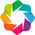

In [82]:

## figure  des  virus  et  leur etude
# Libraries
import holoviews as hv
from holoviews import opts, dim
from bokeh.plotting import show
import pandas as pd

# Backend
hv.extension('bokeh')
hv.output(size=300)


# === Création des nodes ===
virus_names = list(coivirus_etud.index) + [col for col in coivirus_etud.columns if col not in coivirus_etud.index]
virus_names = list(dict.fromkeys(virus_names))  # supprime doublons
nodes_df = pd.DataFrame({
    'index': range(len(virus_names)),
    'name': virus_names
})
nodes = hv.Dataset(nodes_df, 'index')

# === Création des liens ===
links = []
for i, src in enumerate(coivirus_etud.index):
    for j, tgt in enumerate(coivirus_etud.columns):
        value = coivirus_etud.loc[src, tgt]
        if value > 0:
            links.append({
                'source': virus_names.index(src),
                'target': virus_names.index(tgt),
                'value': value
            })

links_df = pd.DataFrame(links)

# === Diagramme Chord ===
chord = hv.Chord((links_df, nodes)).select(value=(1, None))
chord.opts(
    opts.Chord(
        cmap='Category20',
        edge_cmap='Category20',
        edge_color=dim('source').str(),
        labels='name',
        node_color=dim('index').str(),
        width=800,
        height=800
    )
)



# Affichage (hors notebook)
show(hv.render(chord))


In [ ]:
# Ajouter
coivirus_etud.loc["Total"] = coivirus_etud.sum(axis=0)
#coivirus_etud.loc["Total"]
# Supprimer la ligne 'Total'
coivirus_etud = coivirus_etud.drop("Total", axis=0)


In [ ]:
coivirus_etud.head(3)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
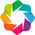

ValueError: In opts.Chord(...), unexpected option 'labels_angle' for Chord type across all extensions. Similar options for current extension ('bokeh') are: ['label_index', 'labelled', 'labels'].

In [76]:
#### Optimisé par Mistral

# Libraries
import holoviews as hv
from holoviews import opts, dim
import pandas as pd

# Backend pour notebook
hv.extension('bokeh')

# === Création des nodes ===
virus_names = list(set(coivirus_etud.index) | set(coivirus_etud.columns))
nodes_df = pd.DataFrame({'index': range(len(virus_names)), 'name': virus_names})
nodes = hv.Dataset(nodes_df, 'index')

# === Création des liens ===
links = []
for src in coivirus_etud.index:
    for tgt in coivirus_etud.columns:
        value = coivirus_etud.loc[src, tgt]
        if value > 0:
            links.append({
                'source': virus_names.index(src),
                'target': virus_names.index(tgt),
                'value': value
            })
links_df = pd.DataFrame(links)

# === Diagramme Chord ===
chord = hv.Chord((links_df, nodes)).select(value=(1, None))
chord.opts(
    opts.Chord(
        cmap='Category20',
        edge_cmap='Category20',
        edge_color=dim('source').str(),
        labels='name',
        node_color=dim('index').str(),
        width=600,
        height=600,
        tools=['hover'],
    ),

    opts.Labels(
        text_font_size='10pt',
        text_align='center',
        text_baseline='middle',
        angle=45   #  rotation en degrés (-45, 90, etc.)
    )
)


chord



<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
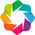

:Chord   [source,target]   (value)

In [81]:
# Version optimisée et corrigée pour Bokeh
import holoviews as hv
from holoviews import opts, dim
import pandas as pd

# Configuration initiale
hv.extension('bokeh')

# === Création optimisée des nodes ===
virus_names = list(set(coivirus_etud.index) | set(coivirus_etud.columns))
nodes_df = pd.DataFrame({
    'index': range(len(virus_names)),
    'name': virus_names
})
nodes = hv.Dataset(nodes_df, 'index')

# === Création optimisée des liens ===
links = [
    {
        'source': virus_names.index(src),
        'target': virus_names.index(tgt),
        'value': coivirus_etud.loc[src, tgt]
    }
    for src in coivirus_etud.index
    for tgt in coivirus_etud.columns
    if coivirus_etud.loc[src, tgt] > 0.01  # Seuil pour filtrer les petites valeurs
]
links_df = pd.DataFrame(links)

# === Diagramme Chord optimisé ===
chord = hv.Chord((links_df, nodes)).select(value=(1, None))

# Configuration visuelle corrigée
chord.opts(
    opts.Chord(
        cmap='Category20',
        edge_cmap='Category20',
        edge_color=dim('source').str(),
        labels='name',
        node_color=dim('index').str(),
        width=800,
        height=800,
        tools=['hover'],
        padding=0.1,
        node_size=15,  # Taille des nœuds augmentée
        edge_line_width=dim('value').norm() * 3,  # Paramètre correct pour Bokeh
        label_text_font_size='12pt',
        node_cmap='Category20',
        edge_alpha=0.7  # Transparence pour les liens
    ),
    opts.Labels(
        text_font_size='12pt',
        text_align='center',
        text_baseline='middle',
        angle=lambda x: (x.start_angle + x.end_angle)/2 + (180 if (x.end_angle - x.start_angle) > 180 else 0),
        text_color='black',
        xoffset=0.18  # Ajustement pour éviter le chevauchement
    )
)

chord
